# AI Tech Challange - Training Script

**This challenge is a component of the selection process for the Bosch Technical Innovation Engineer - Artificial Intelligence position.**
* Title: Child Seat Localization
* Goal: build AI solution for child seat localization in the passenger vehicle
* Problem statement: localization of the child seat in the passenger vehicle enable the business to high-level services and use cases
* Deadline: September 4th 2023
* Data set used: [SVIRO](https://sviro.kl.dfki.de/) e [TICaM](https://vizta-tof.kl.dfki.de/cabin-dataset/)
* Participant: Dr. Ilan Sousa Figueiredo

## Select Model

For object detection tasks, the YOLO pre-trained model stands out as one of the most widely recognized architectures in this domain. It enjoys robust support from a vibrant community of developers and users, which simplifies its implementation through readily available documentation and active discussion forums.

While the latest version, YOLOv8, has been introduced, it has garnered some reports of instability. Consequently, **YOLOv5 emerges as the more dependable choice**.

The YOLOv5 offers a selection of five pre-trained models, each tailored to varying use cases. **My decision led me to opt for the YOLOv5s model**, primarily because it ranks as the second smallest and fastest model in the lineup. This makes it exceptionally well-suited for real-time deployments where speed and efficiency are paramount.

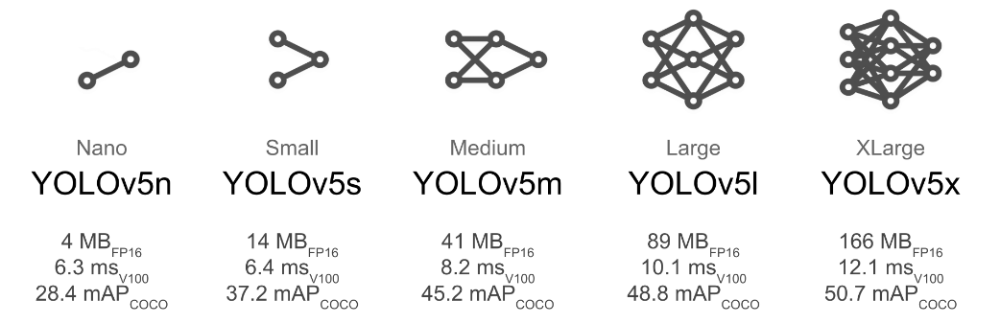

## Importing Python Libraries

In [9]:
import yaml
from PIL import Image
import shutil
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import os

## Clone repository and install requirements

In [2]:
!git clone https://github.com/ultralytics/yolov5  # clone

Cloning into 'yolov5'...
remote: Enumerating objects: 15937, done.
remote: Counting objects: 100% (57/57), done.
remote: Compressing objects: 100% (45/45), done.
remote: Total 15937 (delta 26), reused 30 (delta 12), pack-reused 15880
Receiving objects: 100% (15937/15937), 14.66 MiB | 26.02 MiB/s, done.
Resolving deltas: 100% (10921/10921), done.


In [ ]:
!conda create --name yolov5env

In [ ]:
!conda activate yolov5env

In [ ]:
!pip install -r yolov5/requirements.txt  # install

## Create YOLOv5 Dataset

*  YOLOv5 models must be trained on labelled data in order to learn classes of objects in that data 
* The yaml file shown below, is the dataset config file that defines thet root directory path and relative paths to train / val / test image directories

In [19]:
data = {
    'path': '../datasets',
    'train': [
        'sviro/train/images',
        'ticam/train/images'
    ],
    'val': [
        'sviro/test_with_labels/images'
    ],
    'test': [
        'sviro/test_with_labels/images'
    ],
    'nc': 1,  # Number of classes
    'names': {
        0: 'Empty child seat'
    }
}

# Name of the YAML file you want to save
file_name = './yolov5/data/dataset.yaml'

# Save the content to the YAML file
with open(file_name, 'w') as file:
    yaml.dump(data, file)

print(f"The file {file_name} has been created successfully.")

The file ./yolov5/data/dataset.yaml has been created successfully.


## Training

Training was conducted using the Tesla V100 SXM3-32GB GPU. Here is an overview of the most prominent training parameters for the model:
*  Image resolution: *640x640*
*  Epochs: 400
*  Batch-size: 128 
*  Optimizer: SGD
*  Patience = 200


Remaining parameters were kept at their default settings:
*  Initial learning rate: (1, 1e-5, 1e-1) (SGD=1E-2, Adam=1E-3)
*  Final OneCycleLR learning rate: (1, 0.01, 1.0)
*  Weight decay: (1, 0.0, 0.001)
*  Feed: 0

Fitness is the value that YOLOv5 seeks to maximize. In YOLOv5 it is a default fitness function as a weighted combination of metrics: mAP@0.5 contributes 10% of the weight and mAP@0.5:0.95 contributes the remaining 90%, with Precision P and Recall R absent.

In [ ]:
def fitness(x):
    # Model fitness as a weighted combination of metrics
    w = [0.0, 0.0, 0.1, 0.9]  # weights for [P, R, mAP@0.5, mAP@0.5:0.95]
    return (x[:, :4] * w).sum(1)

In [ ]:
# inside of Yolov5
os.chdir('./yolov5')

In [ ]:
!python train.py --img 640 --epochs 400 --patience 200 --batch-size 32 --optimizer SGD --data dataset.yaml --weights yolov5s.pt --device 0,1,2,3

## Training Evaluation

* Visualization of a collection of images trained by the model

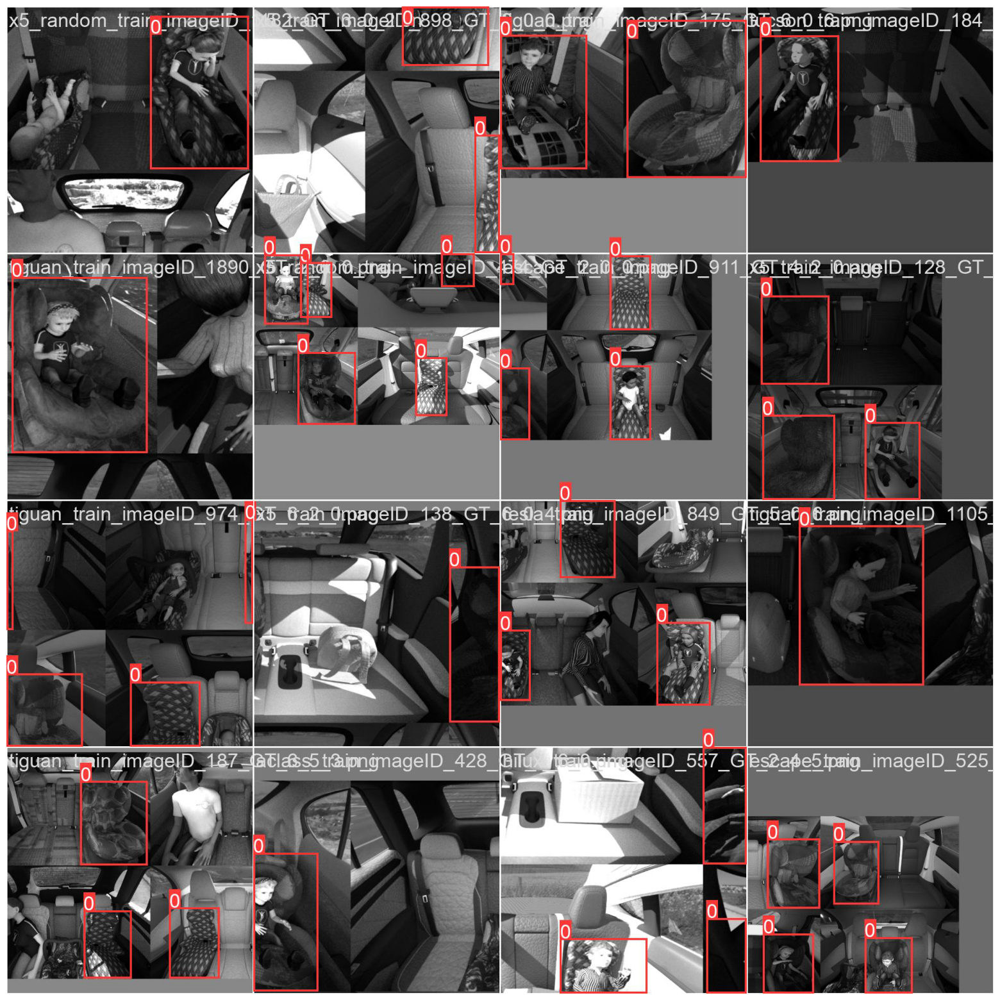

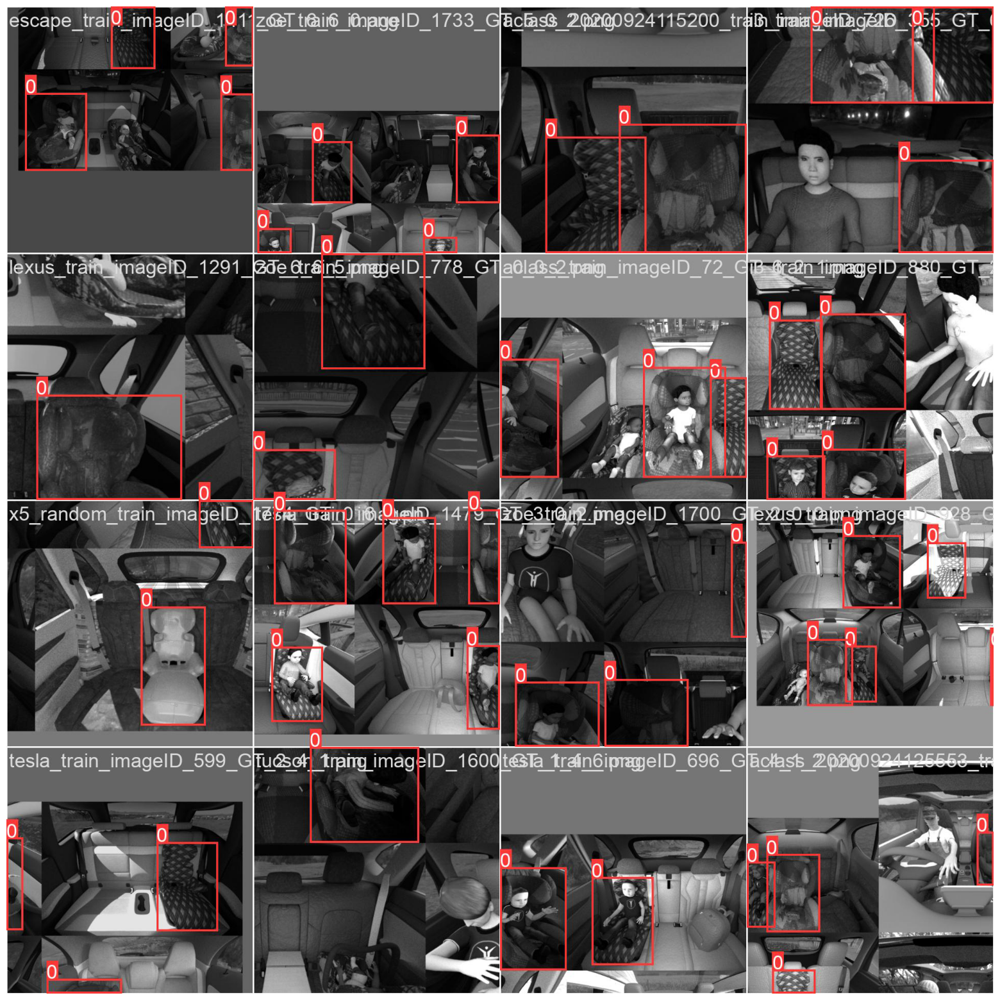

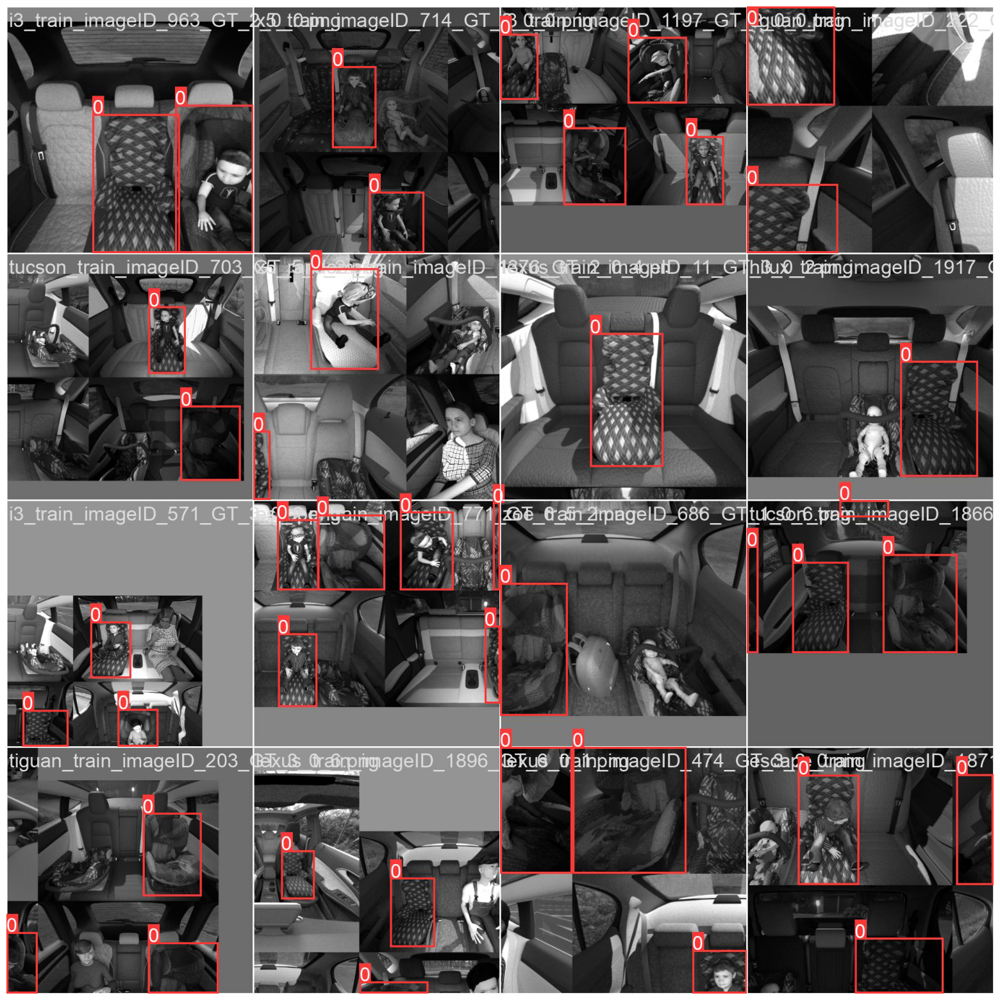

In [4]:
# List of image paths
images = [
    "./runs/train/exp/train_batch0.jpg",
    "./runs/train/exp/train_batch1.jpg",
    "./runs/train/exp/train_batch2.jpg"
]

# Loop to display the images
for image_path in images:
    img = mpimg.imread(image_path)
    plt.figure(figsize=(20,20))
    plt.imshow(img)
    plt.axis('off')  # Turn off the axes
    plt.show()

* Visualization of model training performance

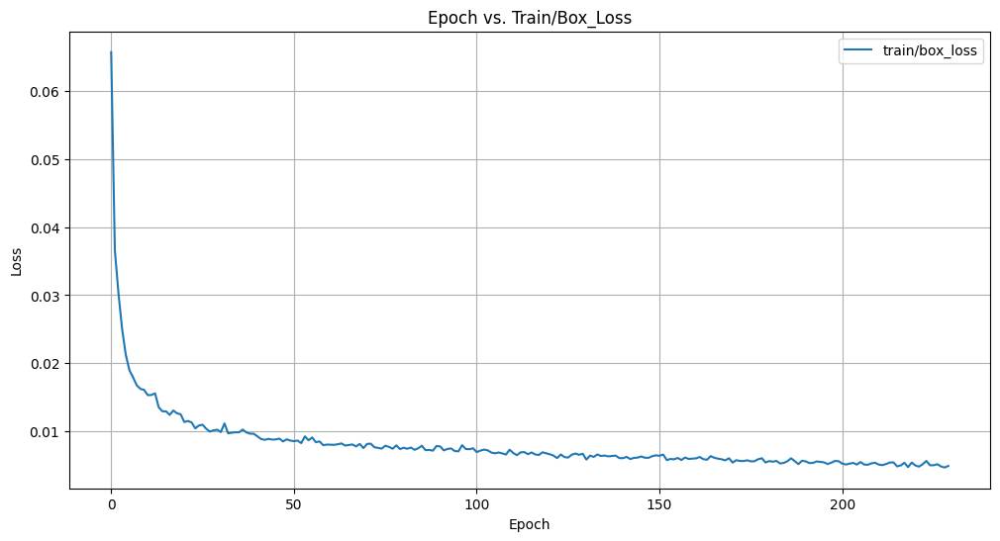

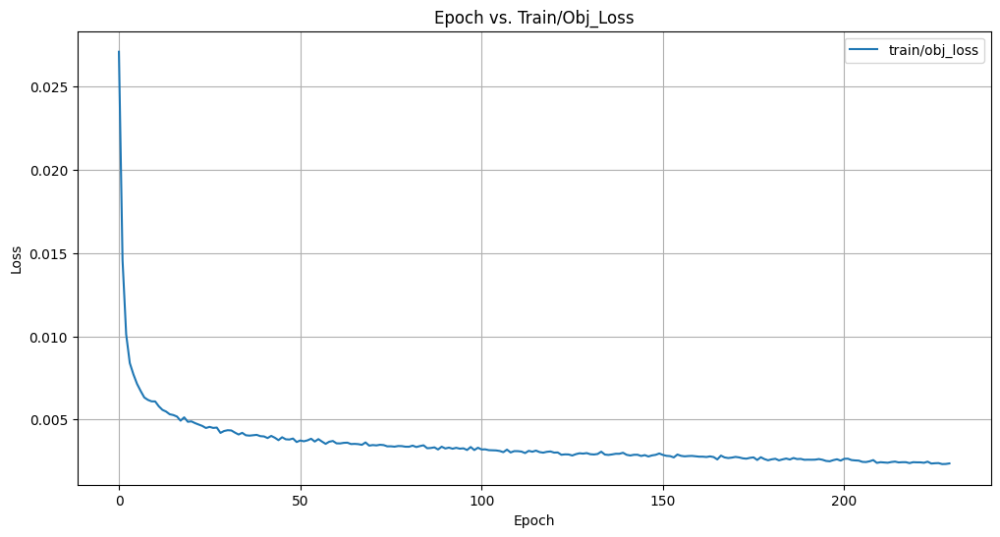

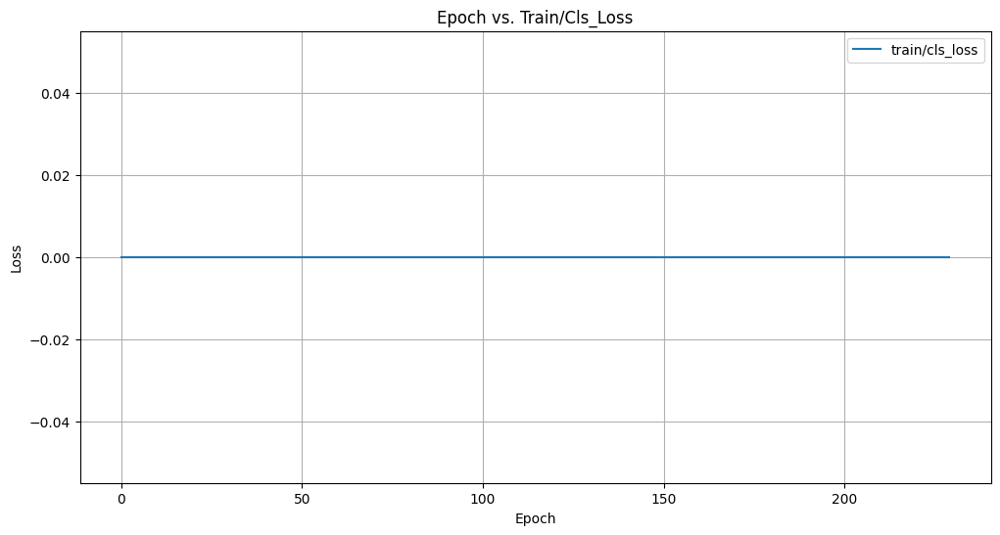

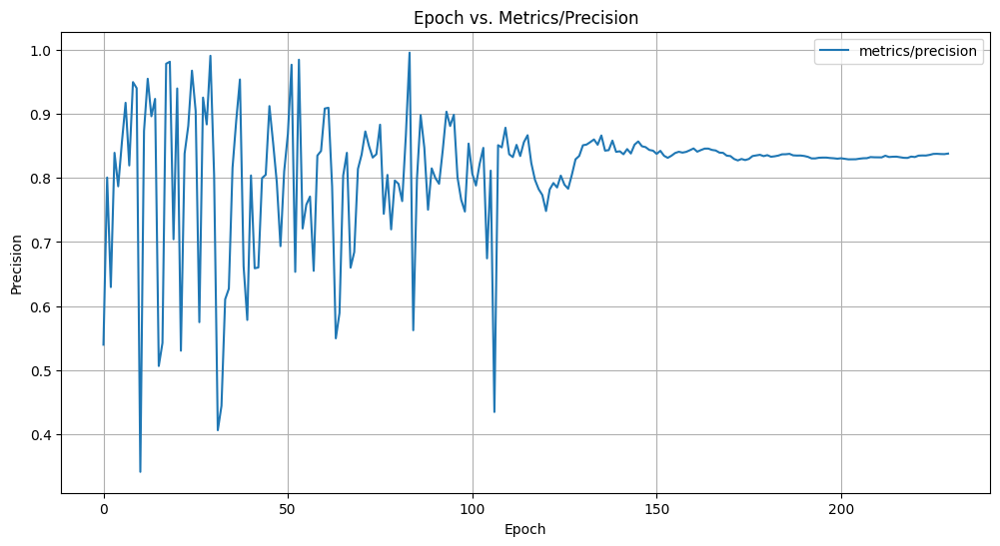

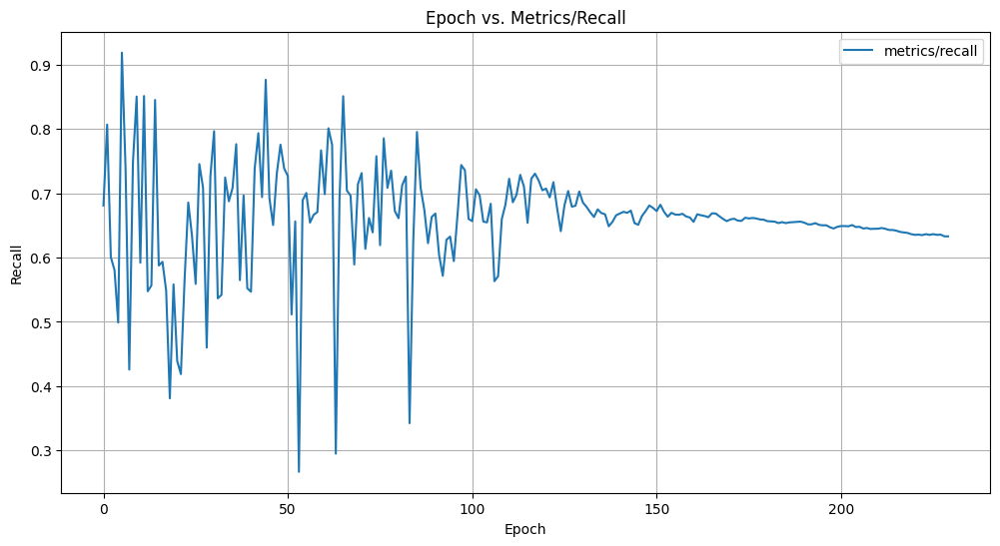

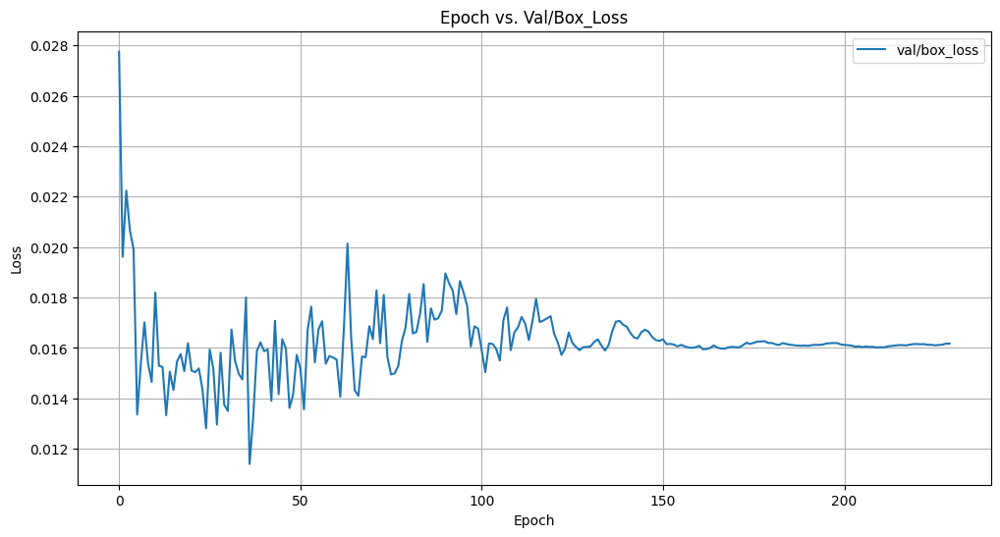

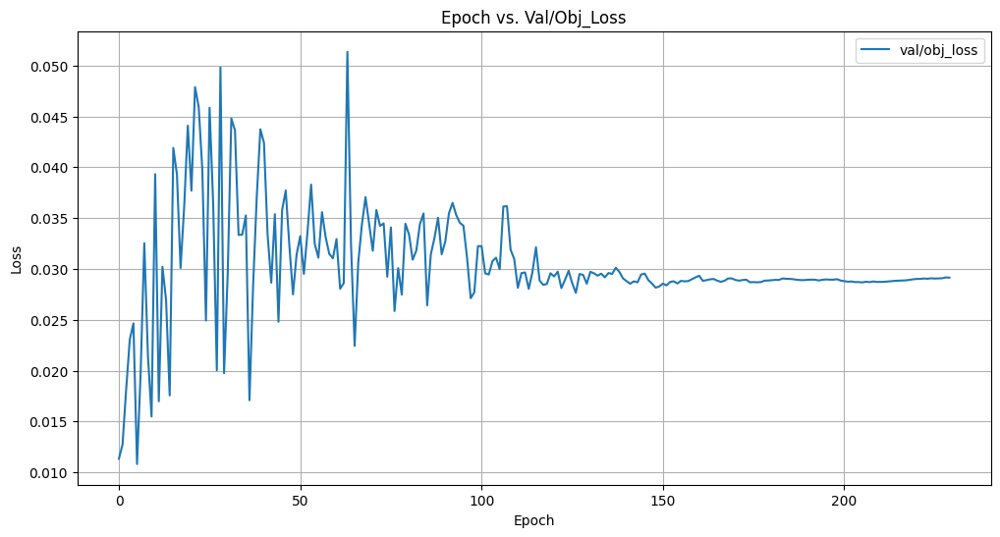

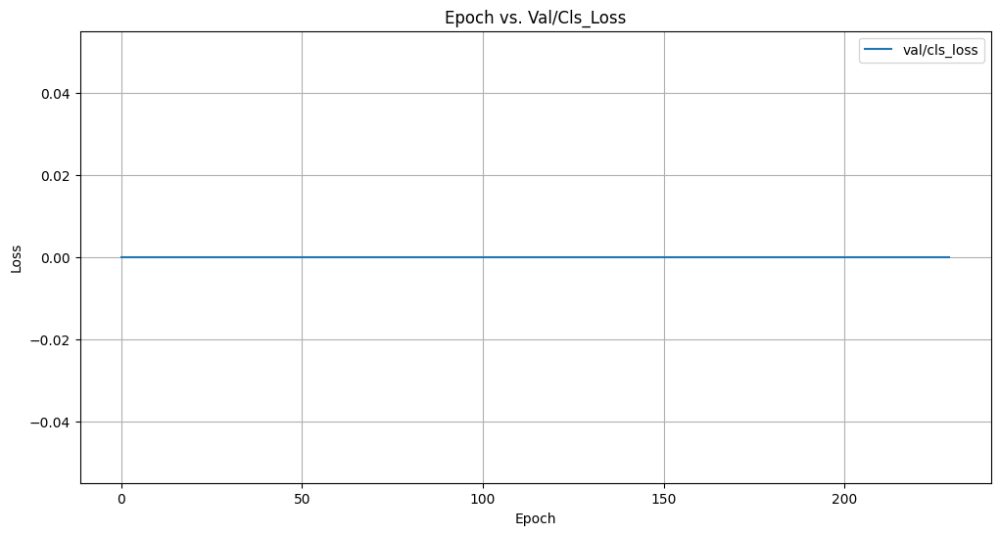

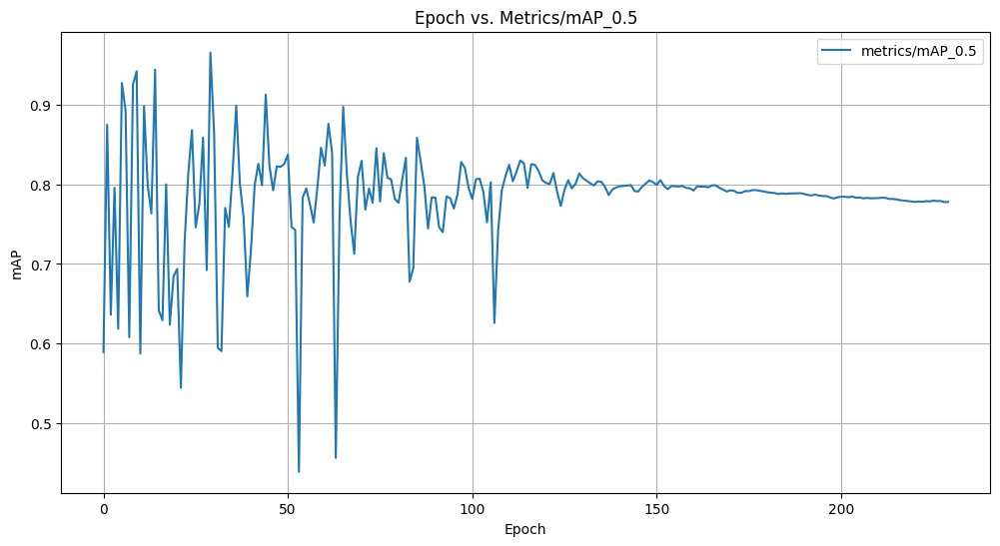

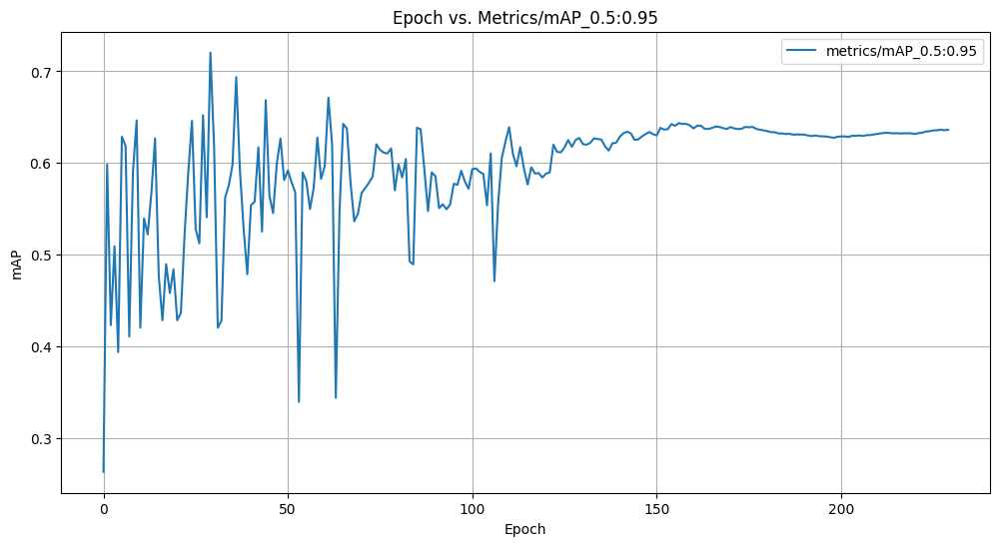

In [6]:
# Path to the CSV file
csv_path = "./runs/train/exp/results.csv"

# Read the CSV file into a Pandas DataFrame
df = pd.read_csv(csv_path,skipinitialspace=True)

# Plot (i) epoch versus train/box_loss
plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['train/box_loss'], label='train/box_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Epoch vs. Train/Box_Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot (ii) epoch versus train/obj_loss
plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['train/obj_loss'], label='train/obj_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Epoch vs. Train/Obj_Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot (iii) epoch versus train/cls_loss
plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['train/cls_loss'], label='train/cls_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Epoch vs. Train/Cls_Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot (iv) epoch versus metrics/precision
plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['metrics/precision'], label='metrics/precision')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.title('Epoch vs. Metrics/Precision')
plt.legend()
plt.grid(True)
plt.show()

# Plot (v) epoch versus metrics/recall
plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['metrics/recall'], label='metrics/recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.title('Epoch vs. Metrics/Recall')
plt.legend()
plt.grid(True)
plt.show()

# Plot (vi) epoch versus val/box_loss
plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['val/box_loss'], label='val/box_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Epoch vs. Val/Box_Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot (vii) epoch versus val/obj_loss
plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['val/obj_loss'], label='val/obj_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Epoch vs. Val/Obj_Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot (viii) epoch versus val/cls_loss
plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['val/cls_loss'], label='val/cls_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Epoch vs. Val/Cls_Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot (ix) epoch versus metrics/mAP_0.5
plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['metrics/mAP_0.5'], label='metrics/mAP_0.5')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('Epoch vs. Metrics/mAP_0.5')
plt.legend()
plt.grid(True)
plt.show()

# Plot (x) epoch versus metrics/mAP_0.5:0.95
plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['metrics/mAP_0.5:0.95'], label='metrics/mAP_0.5:0.95')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('Epoch vs. Metrics/mAP_0.5:0.95')
plt.legend()
plt.grid(True)
plt.show()


## Consufion Matrix, F1-Curve, Precision Recall Curve,

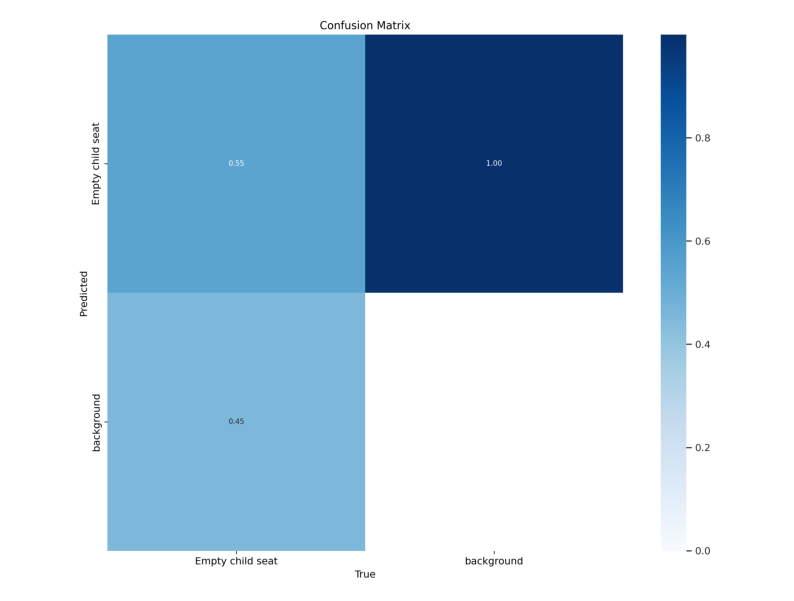

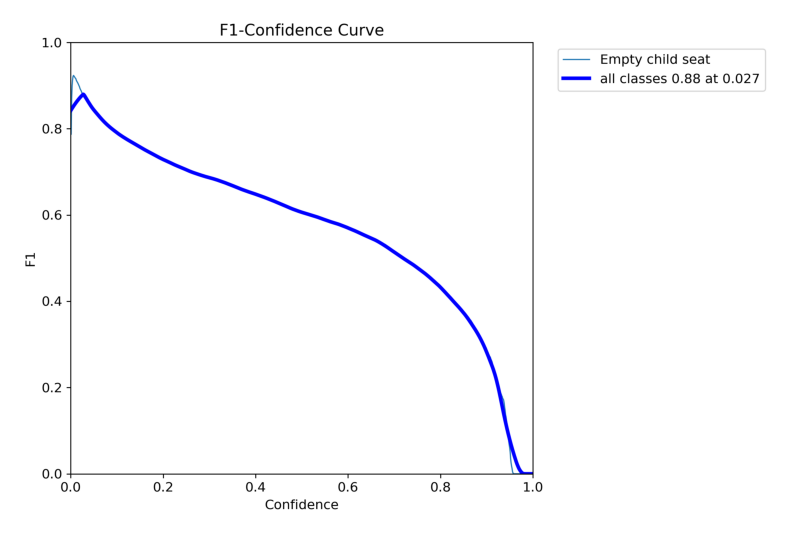

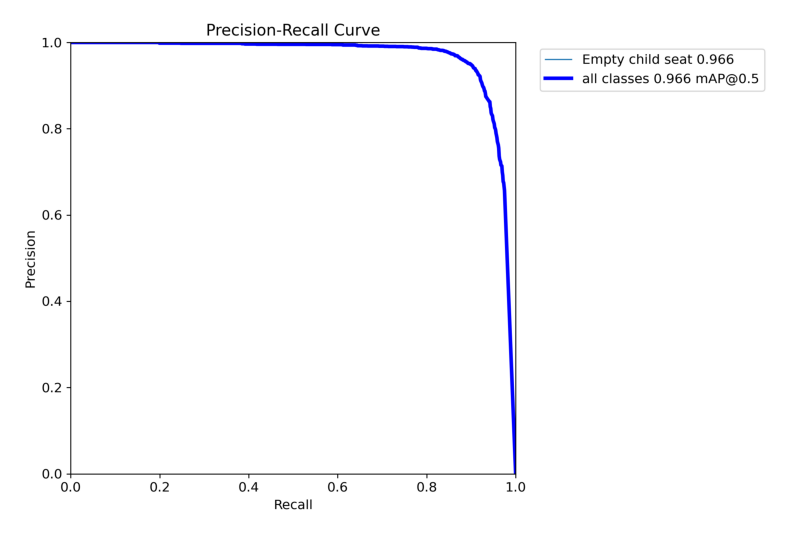

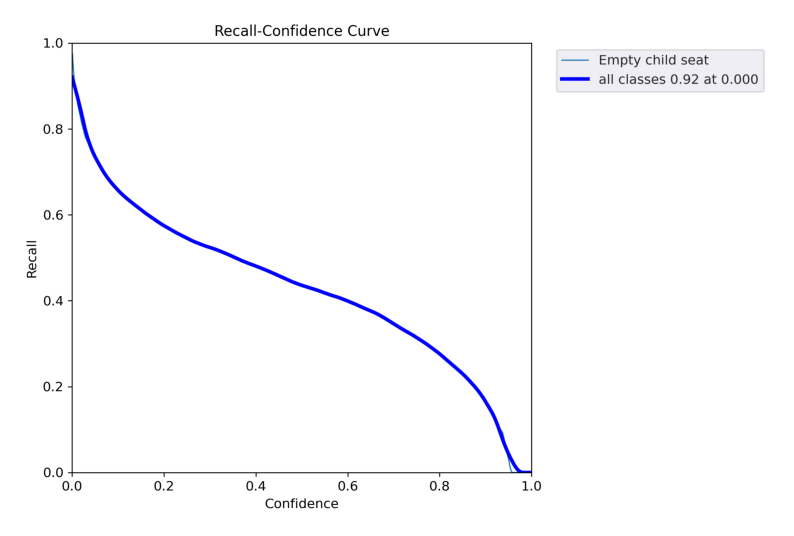

In [8]:
# List of image paths
image_paths = [
    "./runs/train/exp/confusion_matrix.png",
    "./runs/train/exp/F1_curve.png",
    "./runs/train/exp/PR_curve.png",
    "./runs/train/exp//R_curve.png"
]

for path in image_paths:
    try:
        # Open the image
        image = Image.open(path)

        # Create a figure with size (10, 10)
        plt.figure(figsize=(10, 10))

        # Display the image
        plt.imshow(image)
        plt.axis('off')  # Turn off the axes
        plt.show()
    except Exception as e:
        print(f"Error opening or displaying the image at {path}: {e}")

### The end of training script

By: Dr. Ilan Sousa Figueirêdo